In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import matplotlib.pyplot as plt
%matplotlib inline
import spatial_maps as sp
import head_direction as hd
import septum_mec.analysis.data_processing as dp
import expipe
import os
import pathlib
import math
import numpy as np
import exdir
from scipy.interpolate import interp1d
import pandas as pd
from matplotlib import gridspec
import quantities as pq
import elephant as el
import speed_cells.speed as spd
from septum_mec.analysis.multi_plot import (
    spatial, waveform, tfr, speedcor, spikelfp, psth
)
from septum_mec.analysis.plotting import despine, plot_waveforms
from septum_mec.analysis.disimilarities import Data
import seaborn as sns
import neo

15:56:52 [I] klustakwik KlustaKwik2 version 0.2.6


In [3]:
position_sampling_rate = 100 # for interpolation
position_low_pass_frequency = 6 # for low pass filtering of position
max_speed = 1 # m/s only used for speed score
min_speed = 0.02 # m/s only used for speed score
binsize = 0.02 # for rate map and speed
smoothing = 0.03
velocity_threshold = 5

In [4]:
project_path = os.environ.get("SEPTUM_MEC_DATA")
if project_path is None:
    raise Exception("Need to set `SEPTUM_MEC_DATA` as environment variable first.")
else:
    project_path = pathlib.Path(project_path)

In [217]:
action_ids = ["1833-290519-3", "1833-290519-4"]
group_ids = range(8)

data = Data(project_path, action_ids, group_ids, position_sampling_rate, position_low_pass_frequency)

Project path: /media/storage/expipe/septum-mec
Data path: actions/1833-290519-3/data/main.exdir
Project path: /media/storage/expipe/septum-mec
Data path: actions/1833-290519-4/data/main.exdir


/home/mikkel/.virtualenvs/expipe/lib/python3.6/site-packages/matplotlib/figure.py:98: MatplotlibDeprecationWarning: 
Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  "Adding an axes using the same arguments as a previous axes "


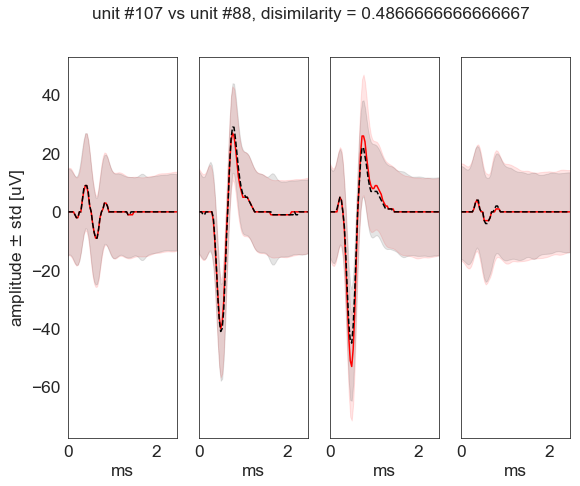

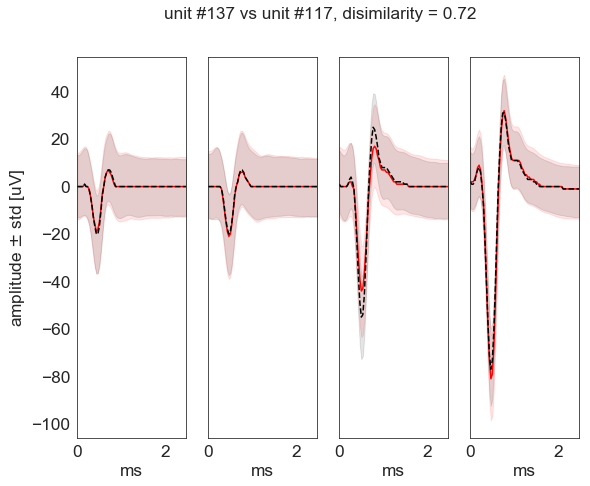

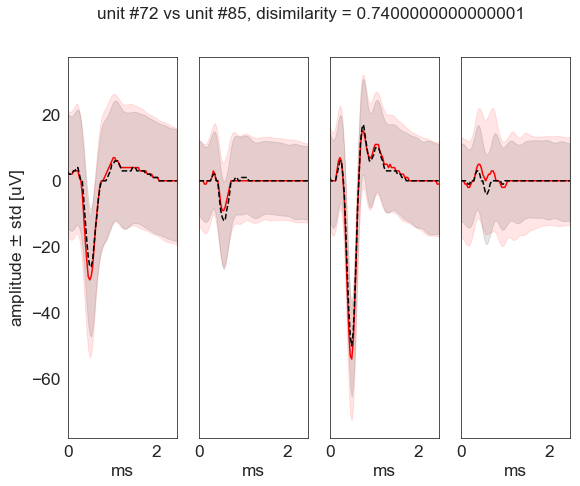

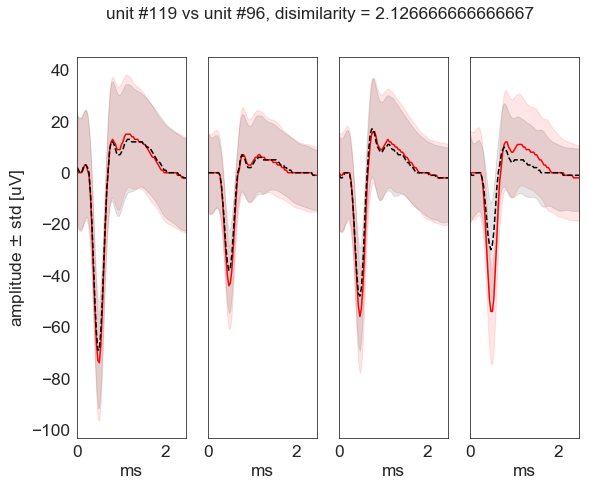

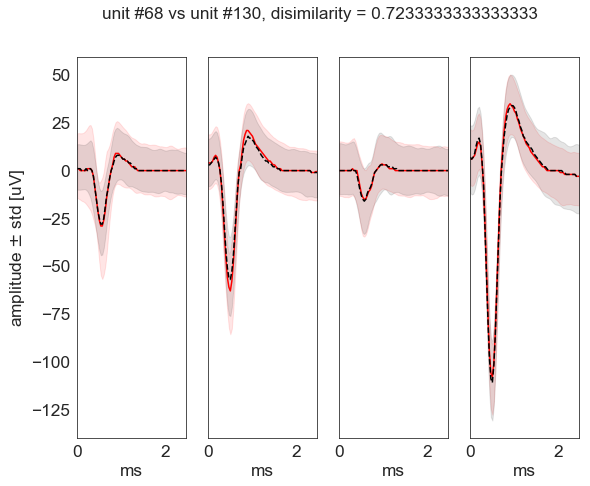

...

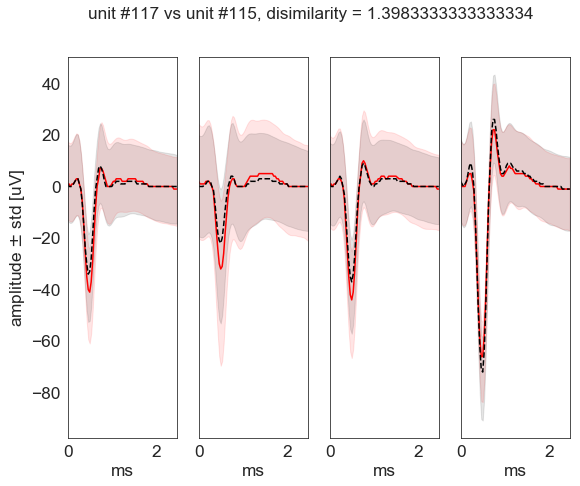

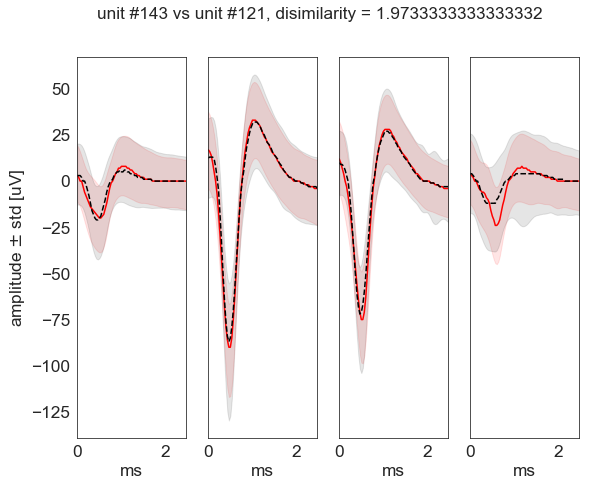

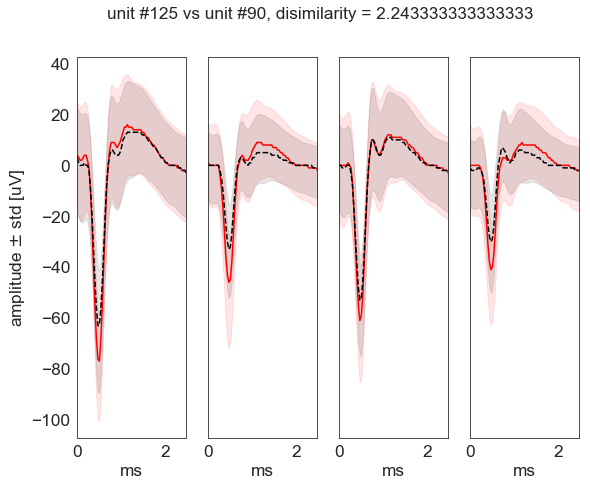

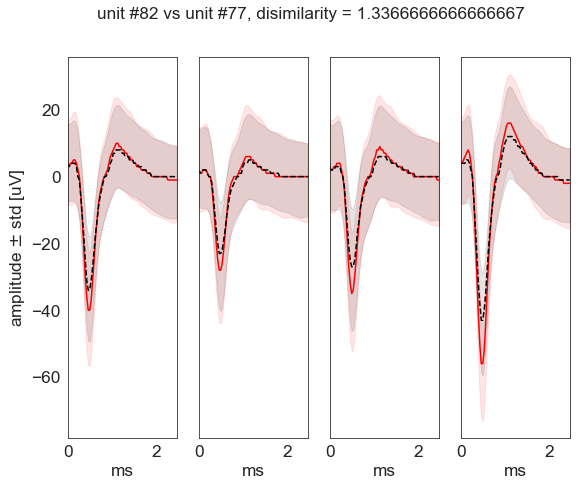

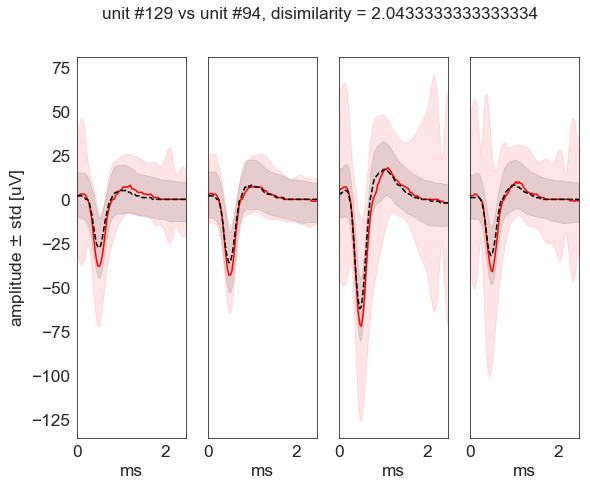

In [223]:
plt.rcParams['figure.figsize'] = (9,7)
plt.rcParams.update({
    k: 'xx-large' for k in plt.rcParams 
    if (
        k.endswith('labelsize') or
        k.endswith('fontsize') or
        k.endswith('titlesize')
    )
})

data.calculate_dissimilarities(threshold=5)

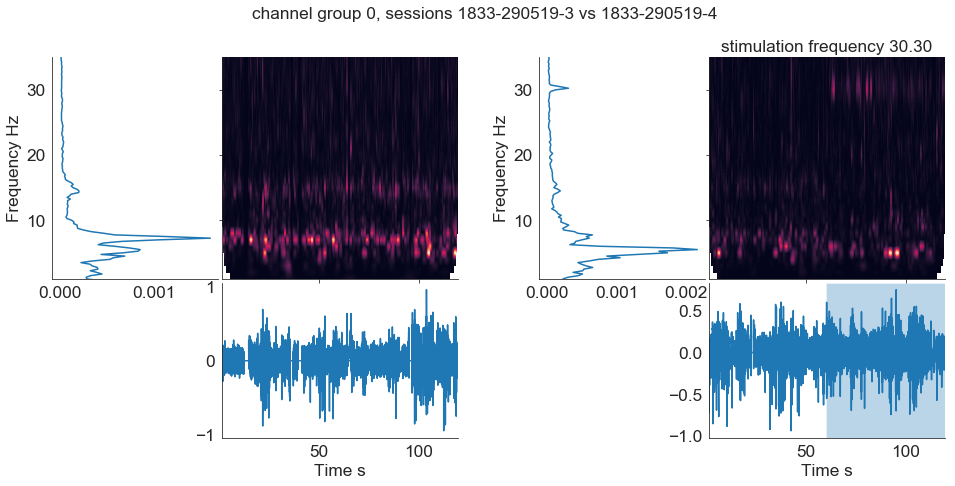

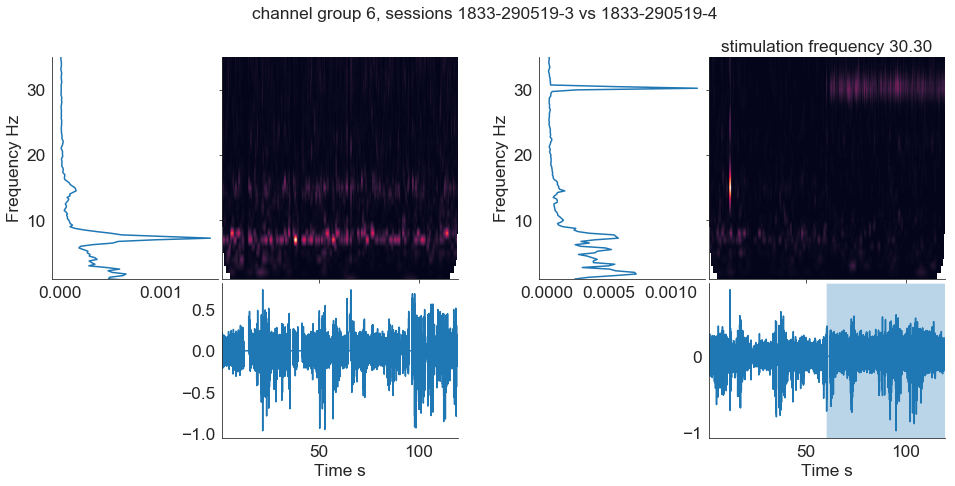

In [219]:
plt.rcParams['figure.figsize'] = (16,9)
plt.rcParams.update({
    k: 'xx-large' for k in plt.rcParams 
    if (
        k.endswith('labelsize') or
        k.endswith('fontsize') or
        k.endswith('titlesize')
    )
})

def plot_all_tfr():
    group_ids = [0,6]
    t_start = 0
    t_stop = None
    
    for group_id in group_ids:
        fig = plt.figure(figsize=(16,7))
        gs = gridspec.GridSpec(1, 2)
        fig.suptitle('channel group {}, sessions {} vs {}'.format(group_id, *action_ids))
        for ai, action_id in enumerate(action_ids):
            l = data[action_id]
            epochs = l['epochs']
            anas = l['groups'][group_id]['anas']
            
            tfr(
                anas=anas, epochs=epochs, fig=fig, gs=gs[ai], 
                t_start=1, t_stop=120, f_start=1, f_stop=35, threshold=1.0)
            despine()
            
plot_all_tfr()

/home/mikkel/.virtualenvs/expipe/lib/python3.6/site-packages/elephant/statistics.py:835: UserWarning: Instantaneous firing rate approximation contains negative values, possibly caused due to machine precision errors.
  warnings.warn("Instantaneous firing rate approximation contains "
/home/mikkel/.virtualenvs/expipe/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3118: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/mikkel/.virtualenvs/expipe/lib/python3.6/site-packages/numpy/core/_methods.py:78: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)
/home/mikkel/.virtualenvs/expipe/lib/python3.6/site-packages/numpy/core/_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


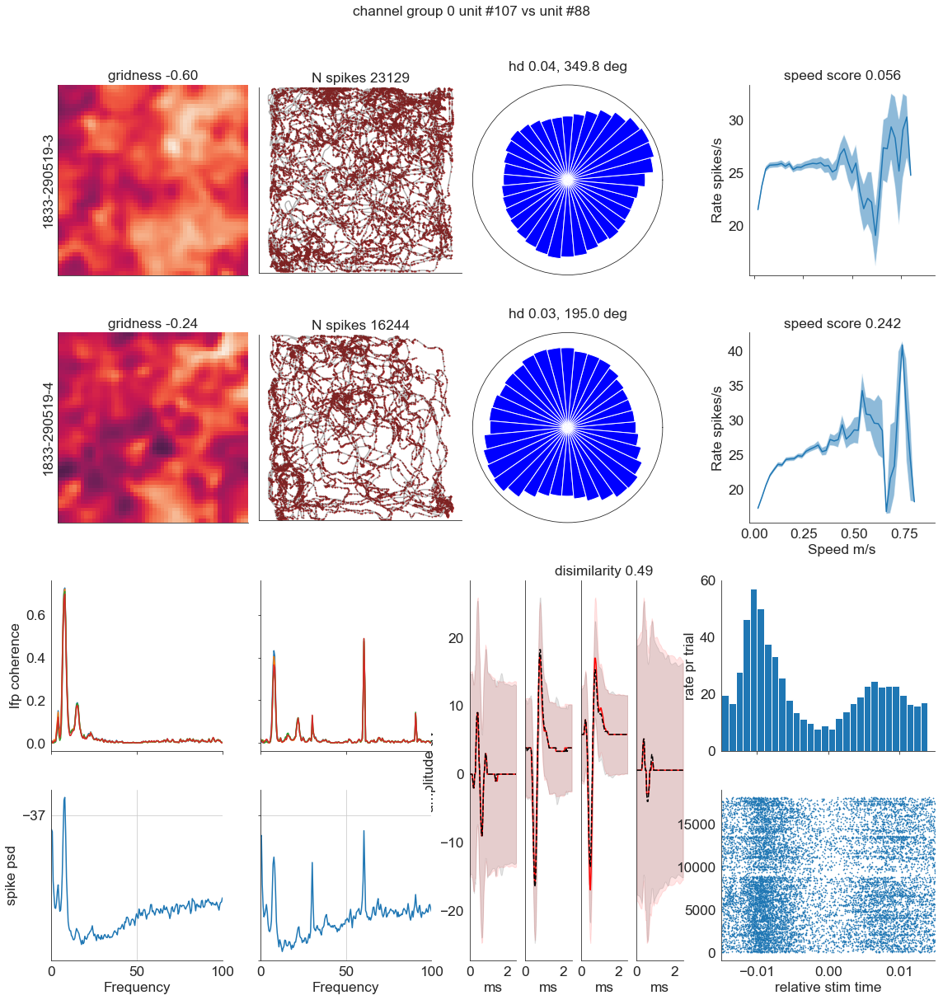

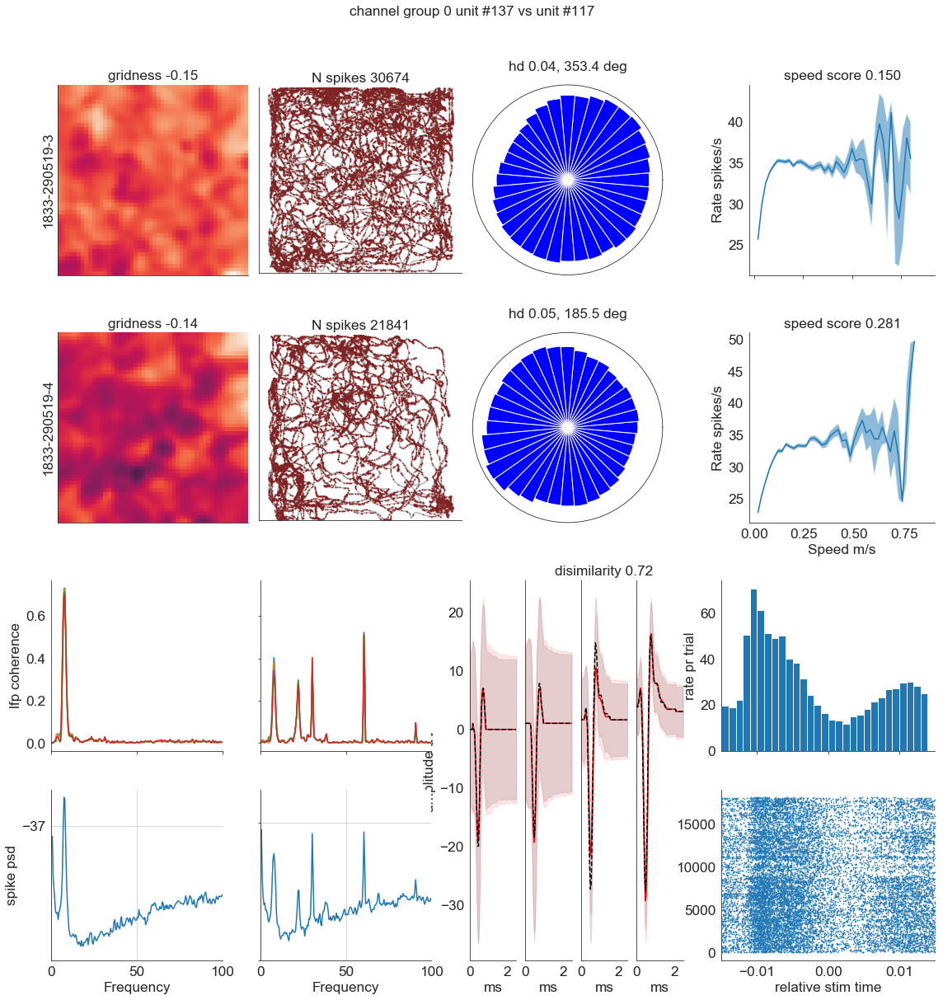

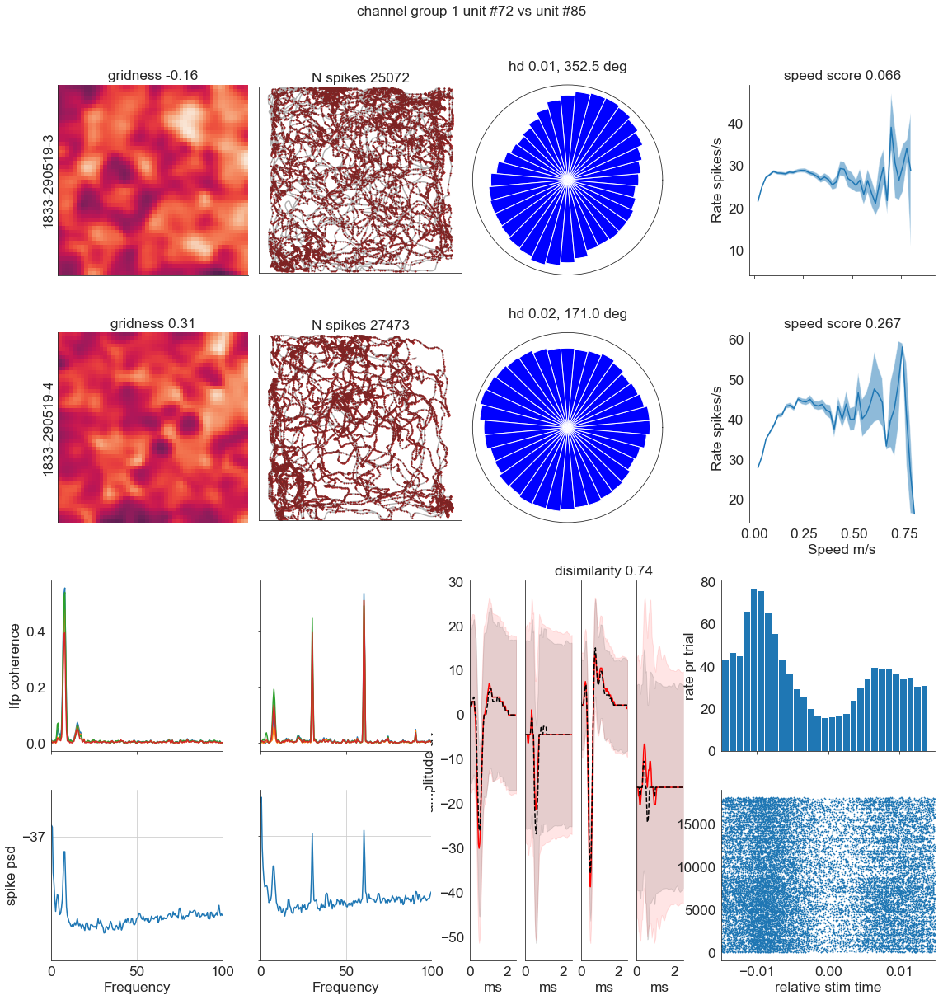

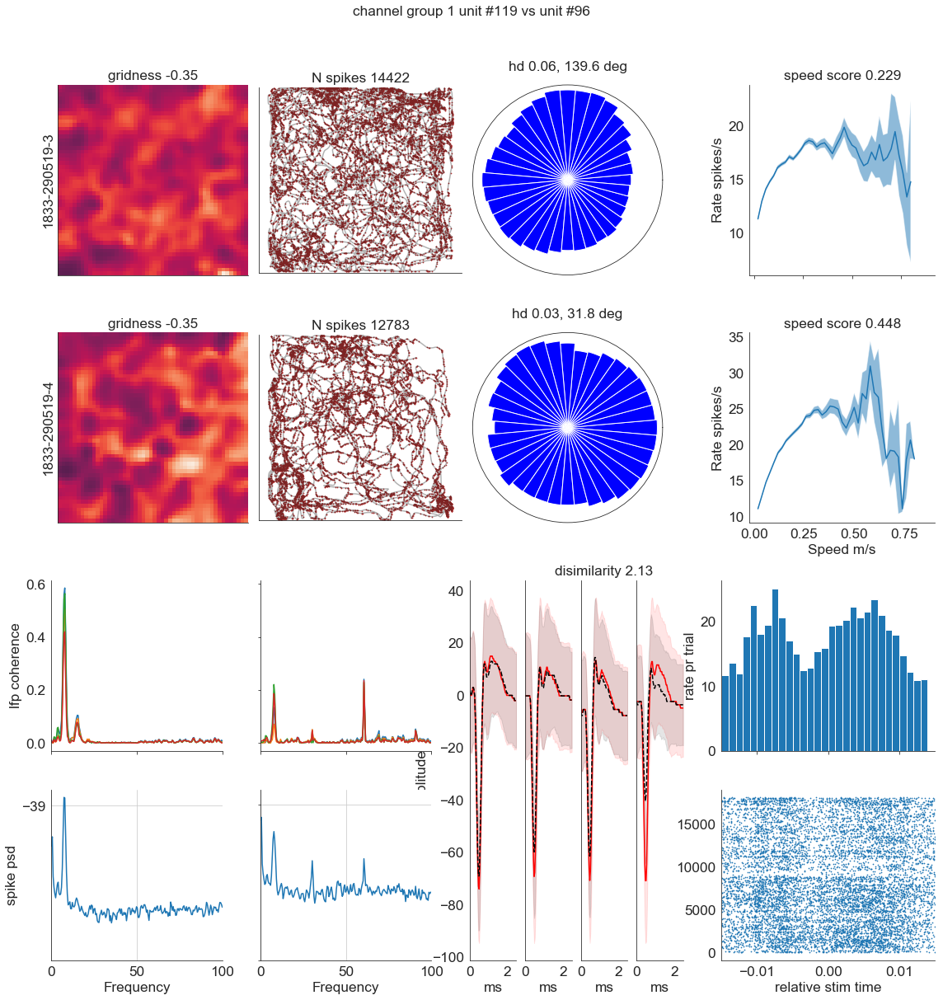

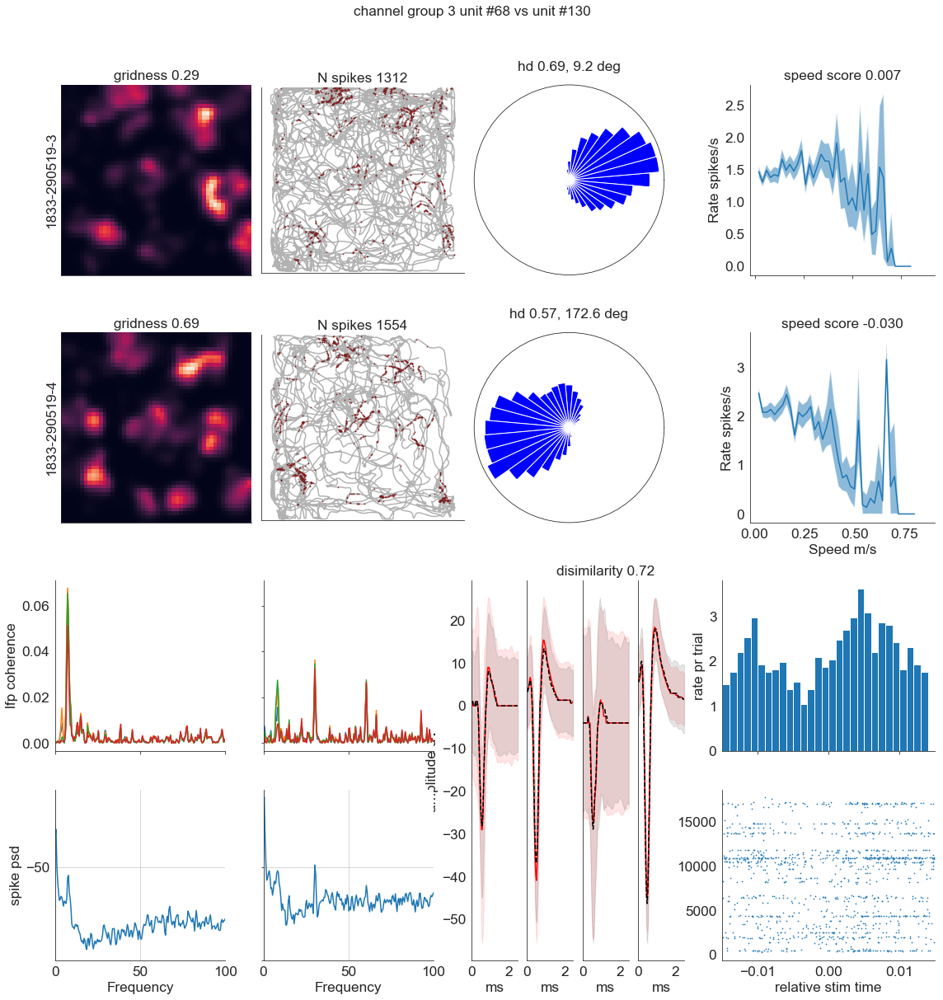

...

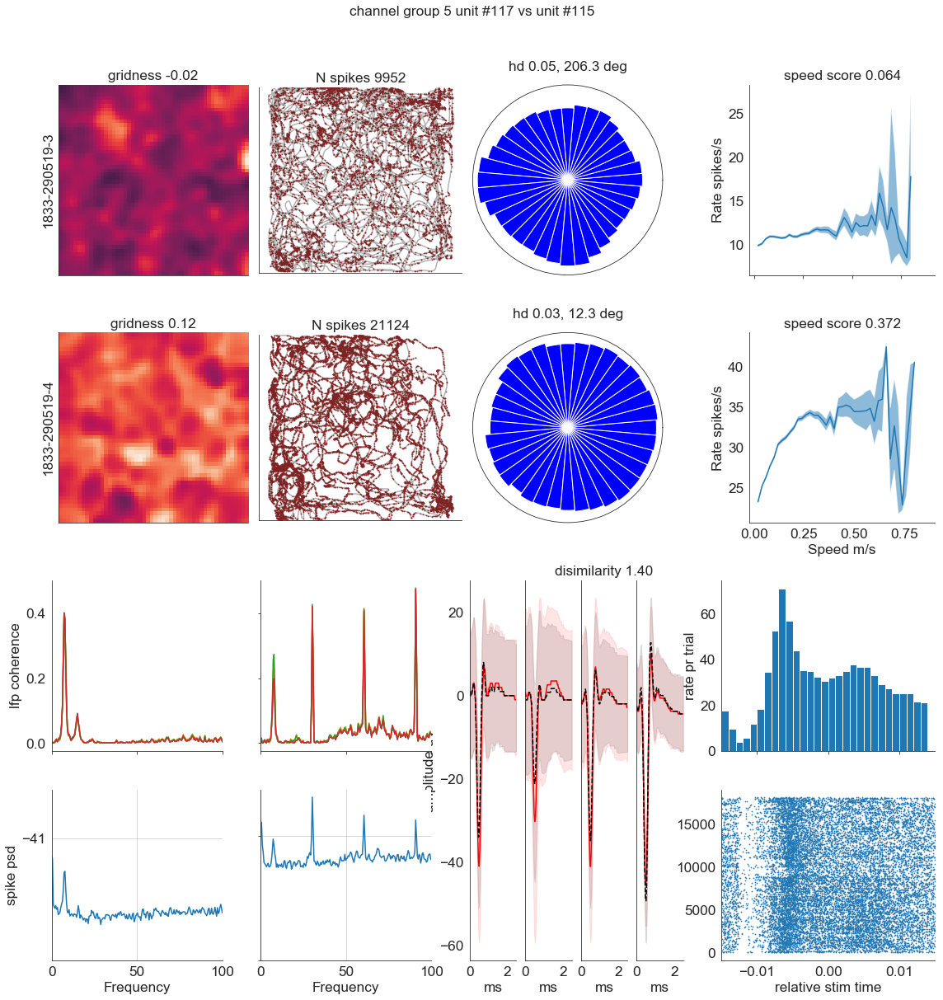

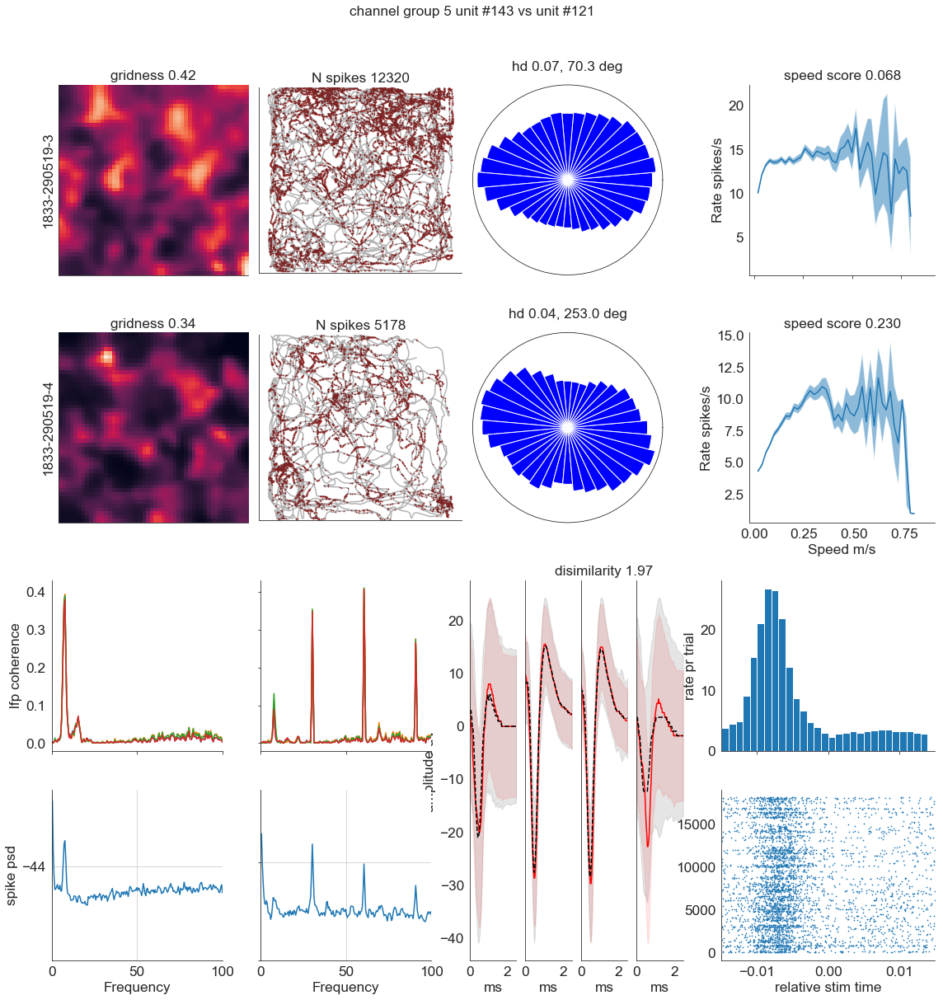

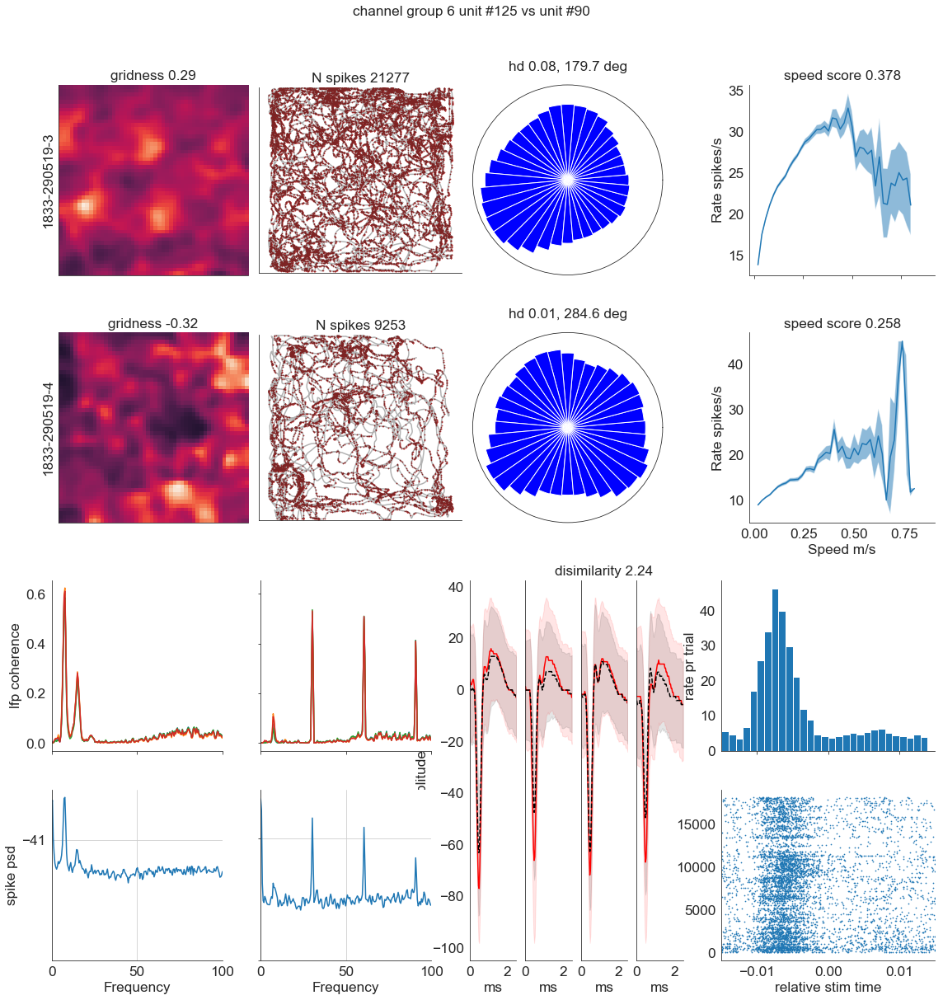

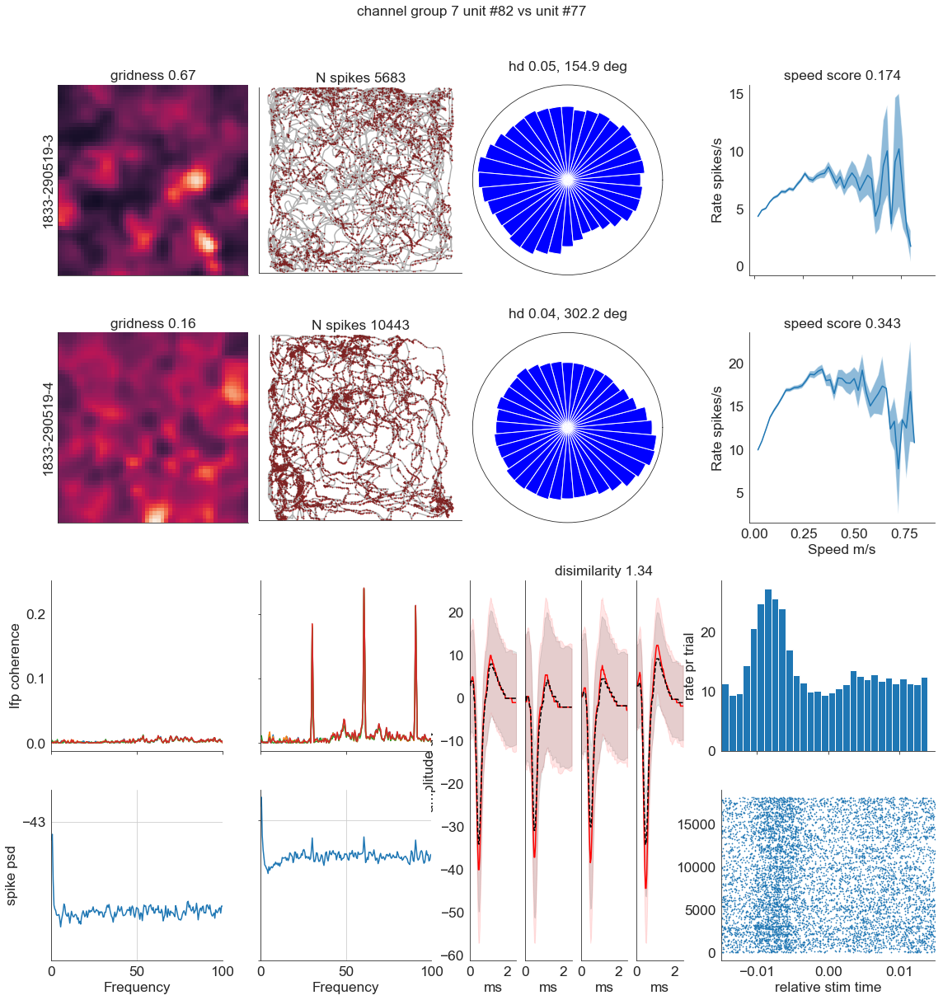

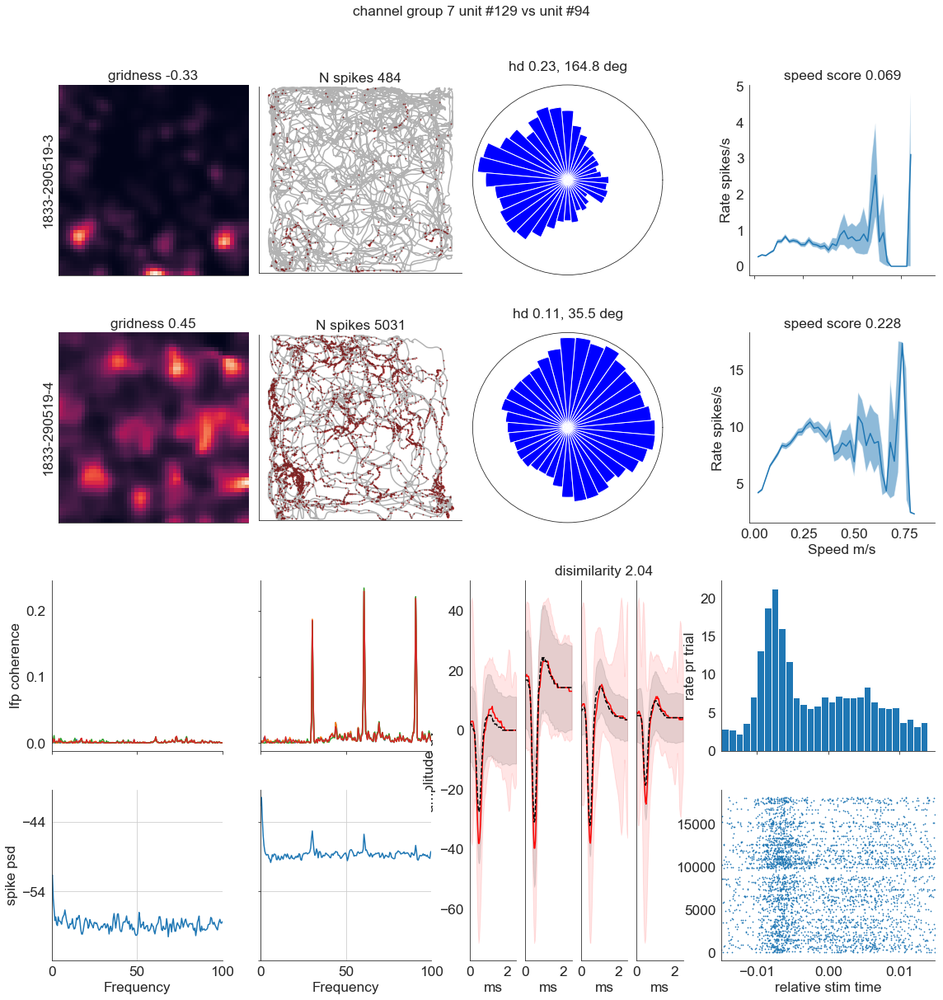

In [220]:
plt.rcParams['figure.figsize'] = (16,16)
plt.rcParams.update({
    k: 'xx-large' for k in plt.rcParams 
    if (
        k.endswith('labelsize') or
        k.endswith('fontsize') or
        k.endswith('titlesize')
    )
})


for pair in data.pairs:
    fig = plt.figure()
    gss = gridspec.GridSpec(3, 1, height_ratios=[1, 1, 2])
    gs11 = gridspec.GridSpecFromSubplotSpec(
        1, 2, subplot_spec=gss[0], 
        width_ratios=[1, .3]
    )
    gs12 = gridspec.GridSpecFromSubplotSpec(
        1, 2, subplot_spec=gss[1], 
        width_ratios=[1, .3]
    )
    gs2 = gridspec.GridSpecFromSubplotSpec(
        1, 4, subplot_spec=gss[2],
        width_ratios=[.8, .8, 1, 1]
    )
    axs_spike_lfp, axs_waveform = None, None
    for i, (unit_id, action_id, gs1) in enumerate(zip(pair, action_ids, [gs11, gs12])):
        spike_times, l = data.get_unit(unit_id, action_id), data[action_id]
        group_id = int(spike_times.annotations['group_id'])

        x, y, t, a, at = l['x'], l['y'], l['t'], l['a'], l['at']
        speed, epochs = l['speed'], l['epochs']
        anas = l['groups'][group_id]['anas']

        axs_spatial = spatial(
            x, y, t, spike_times, a, at, binsize, smoothing, 
            fig, gs1[0, 0], t_start=None, t_stop=None)
        axs_spatial[0].set_ylabel(action_id)

        ax_speed = speedcor(
            speed, t, spike_times, min_speed, max_speed, binsize, 
            fig, gs1[0, 1], t_start=None, t_stop=None)

        idxs = [0, 1]
        axs_spike_lfp = spikelfp(
            spike_times, anas, fig, gs2[0, idxs[i]], # consider setting t_start to 60
            t_start=None, t_stop=None, f_start=0, f_stop=100, axs_share=axs_spike_lfp)

        if len(epochs) > 0:
            stim_times = epochs[0].times.magnitude

            stim_freq = 1 / np.median(np.diff(stim_times))
            if stim_freq < 35 and stim_freq > 29:
                stim_cut = 0.015
            else:
                stim_cut = 0.030
            psth(
                spike_times, stim_times, fig, gs2[0, 3], 
                pre_stim=-stim_cut, post_stim=stim_cut, binsize=0.001, 
                t_start=None, t_stop=None)

        ls, color = ['-', '--'], ['r', 'k']
        axs_waveform = waveform(
            spike_times, fig, gs2[0, 2], t_start=None, t_stop=None, 
            ls=ls[i], color=color[i], axs=axs_waveform)
        axs_waveform[2].set_title('disimilarity {:.2f}'.format(pair[2]))

        despine()
        if i == 1:
            despine(axs_spike_lfp, yticks=False)
            for ax in axs_spike_lfp:
                ax.set_ylabel('')
        else:
            despine(ax_speed, xticks=False)
            ax_speed.set_xlabel('')
    plt.tight_layout()
    fig.suptitle(
        'channel group {} {} vs {}'.format(group_id, pair[0], pair[1]), y=1.05)

/home/mikkel/.virtualenvs/expipe/lib/python3.6/site-packages/elephant/statistics.py:835: UserWarning: Instantaneous firing rate approximation contains negative values, possibly caused due to machine precision errors.
  warnings.warn("Instantaneous firing rate approximation contains "
/home/mikkel/.virtualenvs/expipe/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3118: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/mikkel/.virtualenvs/expipe/lib/python3.6/site-packages/numpy/core/_methods.py:78: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)
/home/mikkel/.virtualenvs/expipe/lib/python3.6/site-packages/numpy/core/_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


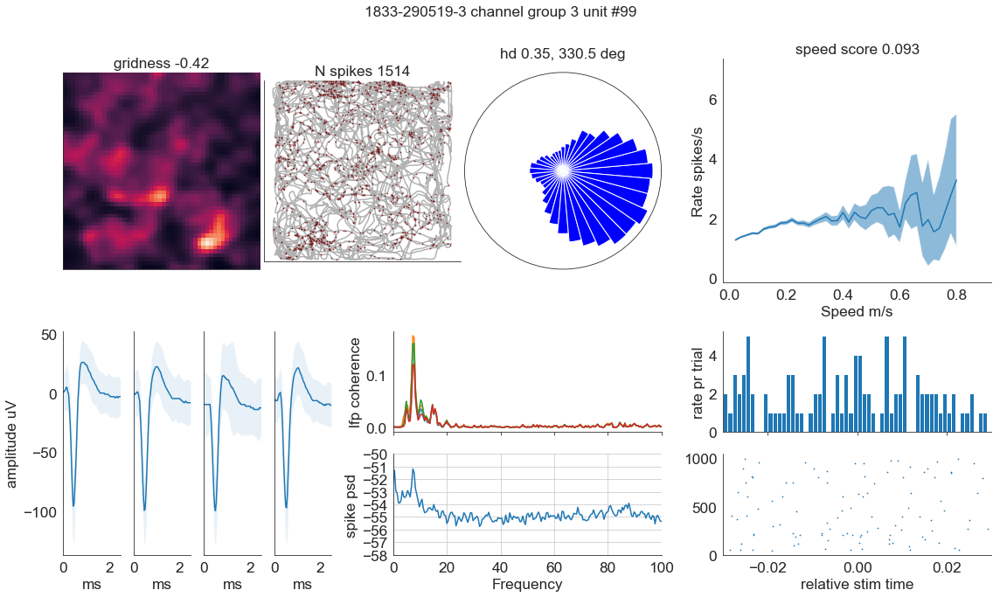

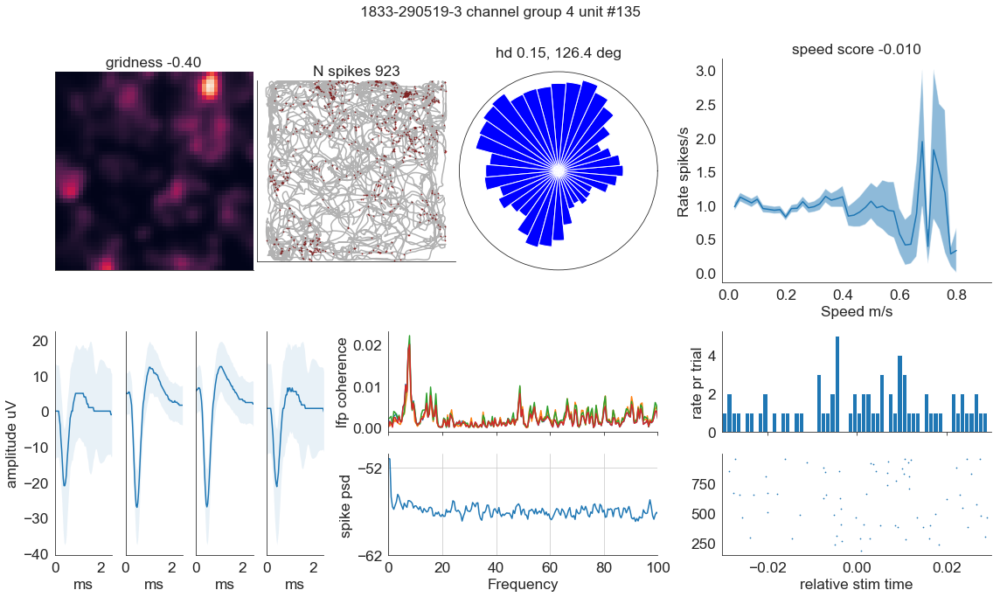

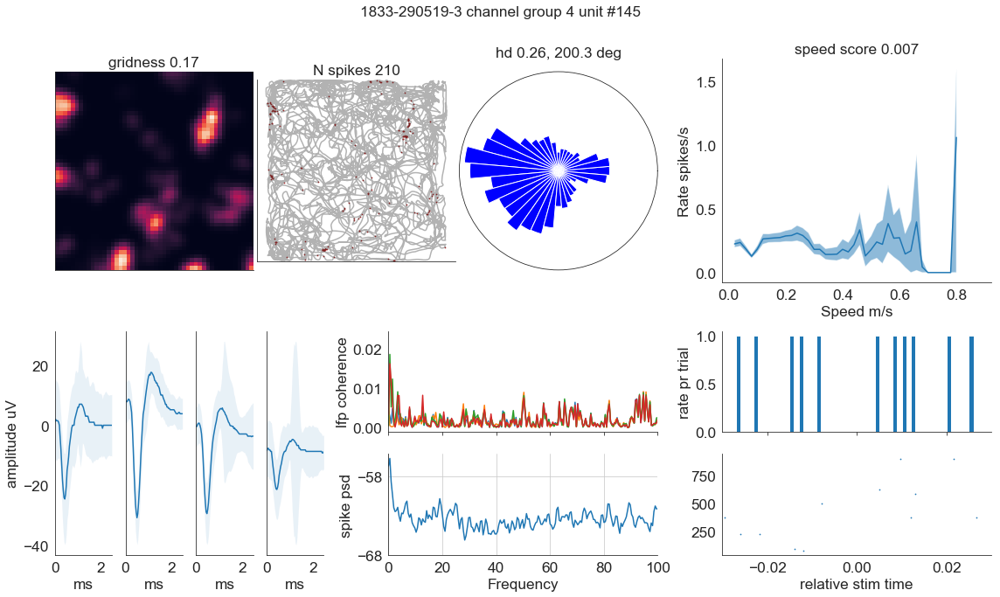

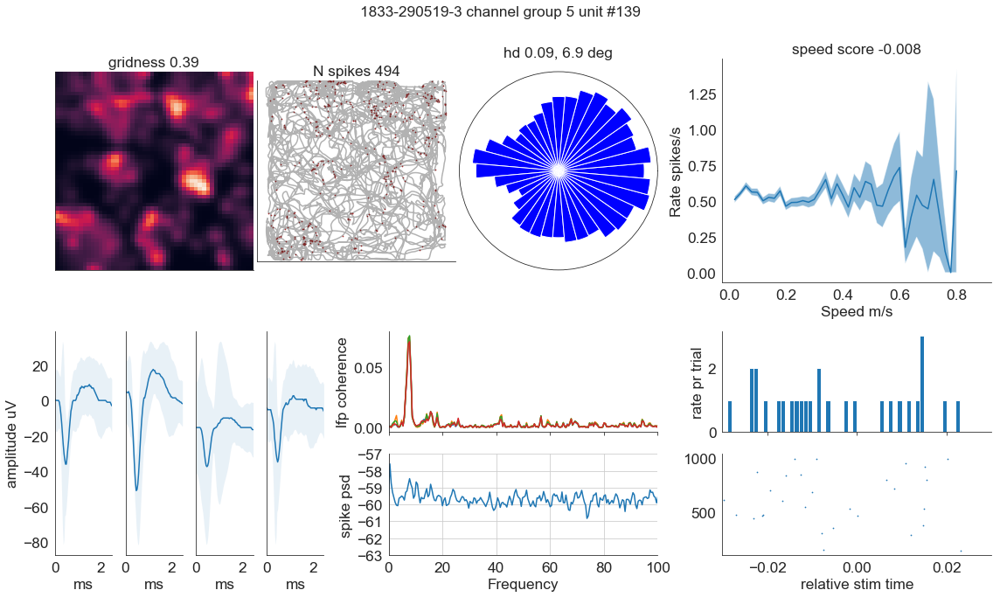

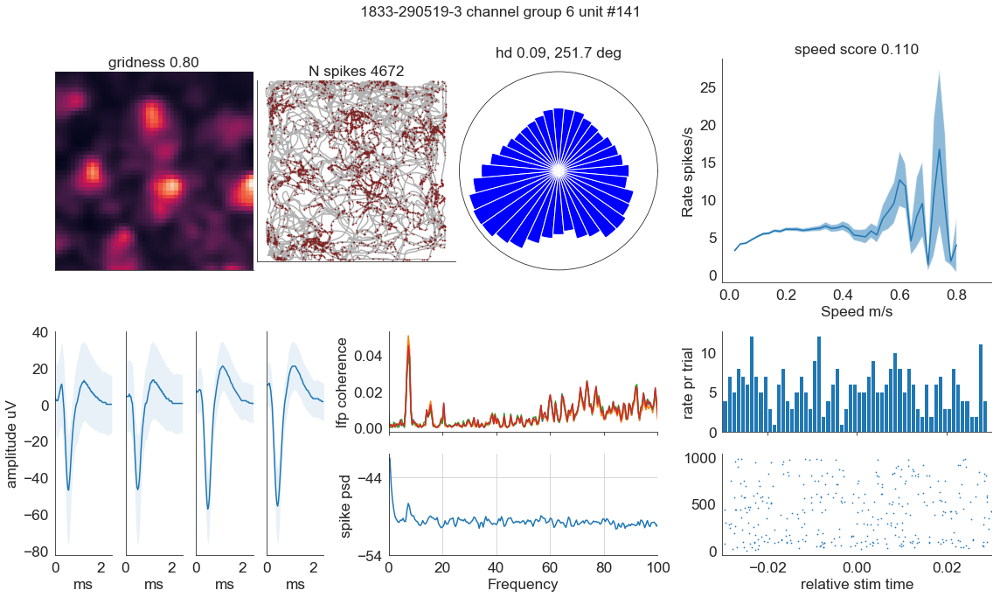

...

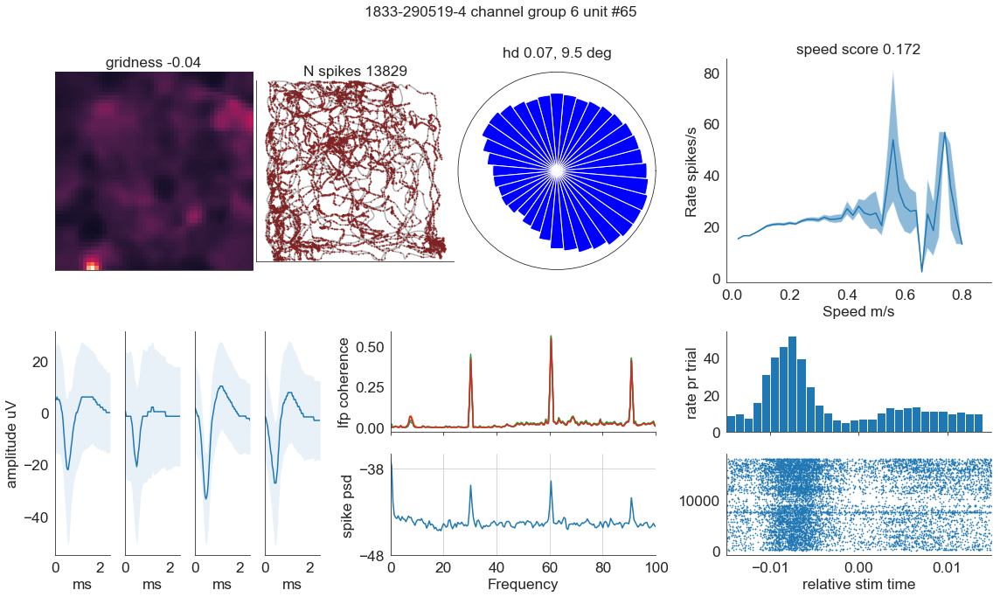

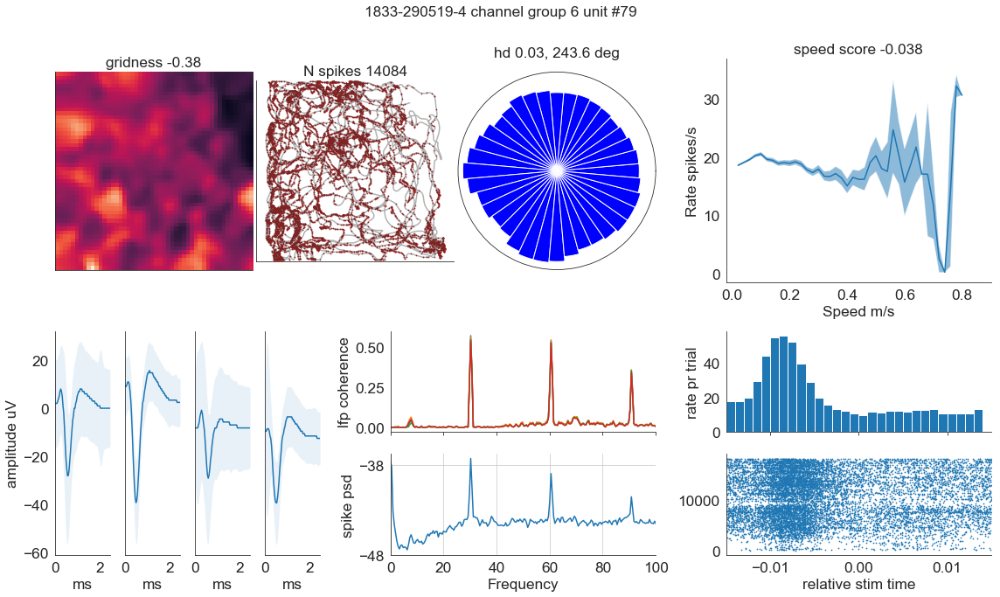

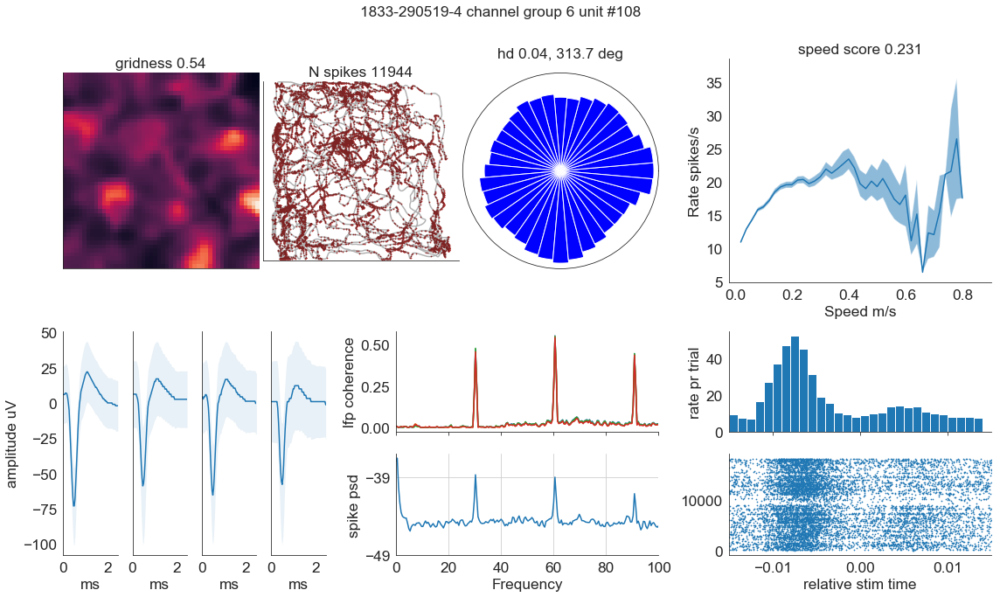

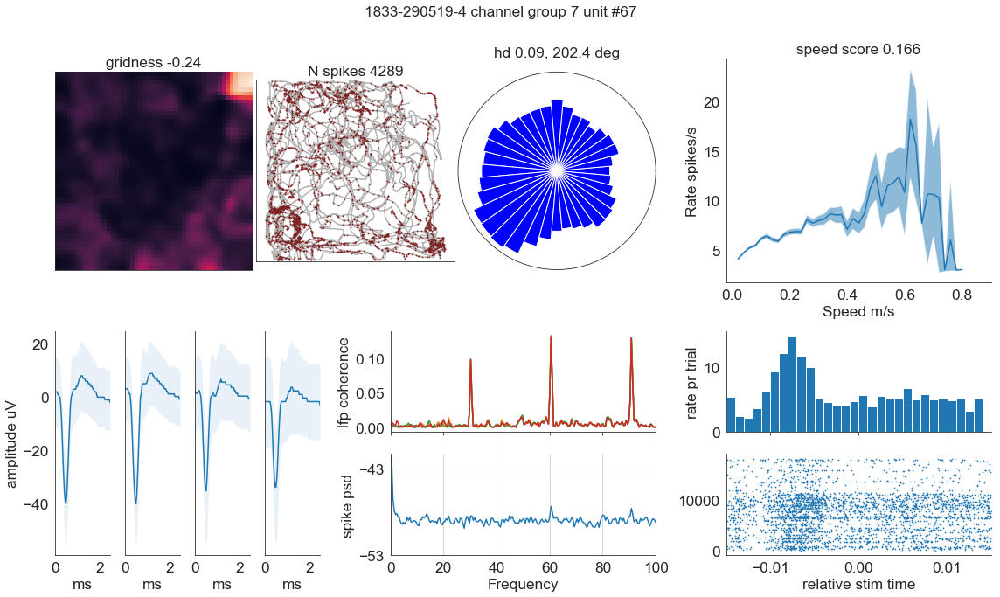

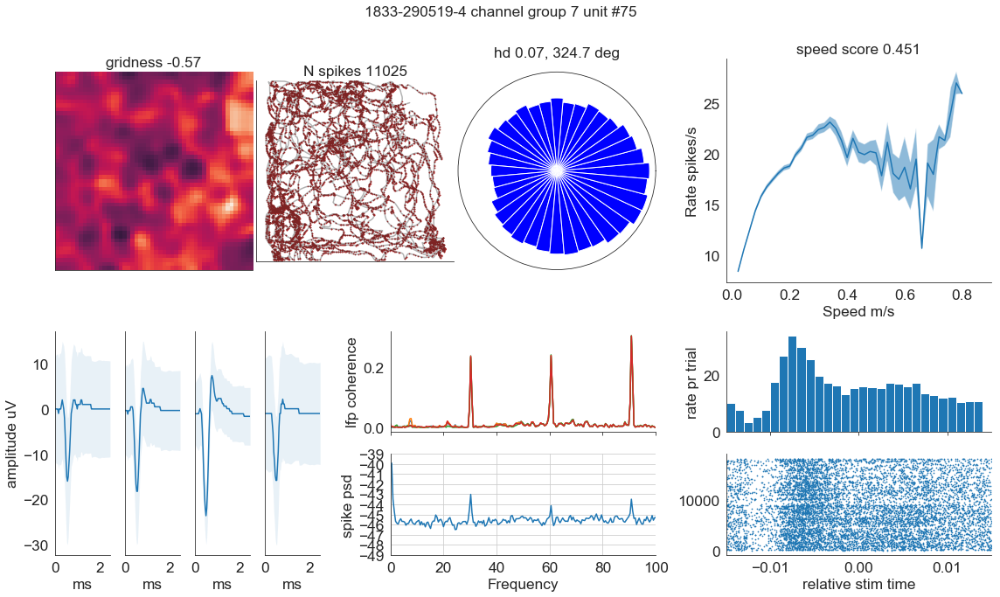

In [222]:
plt.rcParams['figure.figsize'] = (16,9)
plt.rcParams.update({
    k: 'xx-large' for k in plt.rcParams 
    if (
        k.endswith('labelsize') or
        k.endswith('fontsize') or
        k.endswith('titlesize')
    )
})

def plot_all_cells():
    for action_id, unit_ids in data.remains.items():
        for unit_id in unit_ids:
            spike_times, l = data.get_unit(unit_id, action_id), data[action_id]
            group_id = int(spike_times.annotations['group_id'])
            x, y, t, a, at = l['x'], l['y'], l['t'], l['a'], l['at']
            speed, epochs = l['speed'], l['epochs']
            anas = l['groups'][group_id]['anas']

            # select random times if no stimulation to make rasters
            stim_times = np.linspace(0, t[-1]-.03, 1000) if len(epochs) == 0 else epochs[0].times.magnitude
            stim_freq = 1 / np.median(np.diff(stim_times))
            if stim_freq < 35 and stim_freq > 29:
                stim_cut = 0.015
            else:
                stim_cut = 0.030
        
            fig = plt.figure()
            gs = gridspec.GridSpec(2, 3)
            fig.suptitle('{} channel group {} {}\n'.format(
                action_id, spike_times.annotations['group_id'], spike_times.annotations['name']), y=1.05)
            
            spatial(
                x, y, t, spike_times, a, at, binsize, smoothing, 
                fig, gs[0,:2], t_start=None, t_stop=None)
                        
            speedcor(
                speed, t, spike_times, min_speed, max_speed, binsize, 
                fig, gs[0, 2], t_start=None, t_stop=None)
            
            waveform(
                spike_times, fig, gs[1,0], t_start=None, t_stop=None)
            
            spikelfp(
                spike_times, anas, fig, gs[1,1], # consider setting t_start to 60
                t_start=None, t_stop=None, f_start=0, f_stop=100)
            
            psth(
                spike_times, stim_times, fig, gs[1,2], pre_stim=-stim_cut, post_stim=stim_cut, binsize=0.001, 
                t_start=None, t_stop=None)
            
            despine()
            plt.tight_layout()
            
plot_all_cells()

In [ ]:
data.remains

Text(0.5, 0, 'm/s')

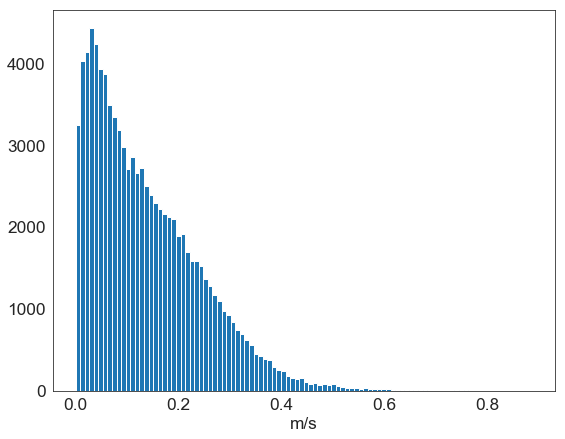

In [227]:
plt.hist(data[0]['speed'], bins=100);
plt.xlabel('m/s')